In [ ]:
!pip install fastbook
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
key='a27e30b8f62448c3b6715ed46a638938'
!pip install azure-cognitiveservices-search-imagesearch

In [ ]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [ ]:
bear_types='grizzly','black','teddy'


In [ ]:
from pathlib import Path
from fastai.vision.all import *  # Assuming you're using fastai's search_images_bing function

# Assuming you've defined 'key' and 'bear_types'

# Define the root path where you want to save the images
root_path = Path("bears")  # Replace with your desired root path
if not root_path.exists():
    root_path.mkdir()

# Iterate over bear types and download images for each type
for bear_type in bear_types:
    bear_path = root_path / bear_type  # Path for each bear type
    if not bear_path.exists():
        bear_path.mkdir()

    # Use fastai's search_images_bing to get image URLs
    results = search_images_bing(key, f'{bear_type} bears')

    # Extract image URLs and download the images
    urls = results.attrgot('contentUrl')
    download_images(bear_path, urls=urls)  # Assuming download_images function saves images to bear_path


In [ ]:
fns=get_image_files(root_path)
fns
failed=verify_images(fns)
failed

(#19) [Path('bears/grizzly/4e8897c7-1b44-45ad-a2ff-d93d6b51e269.jpg'),Path('bears/grizzly/3208b848-c56f-4c8d-9d77-f39f7cb84351.JPG'),Path('bears/grizzly/fa2d32e9-c5b1-4b6b-a487-fa5cc2297983.jpg'),Path('bears/grizzly/fad8a969-91c1-4b0c-a156-2788f60bc612.jpg'),Path('bears/grizzly/7c5f35c4-26a5-43ce-bbf8-59418a6f1ce7.jpg'),Path('bears/teddy/935c522f-b789-40ba-a003-256958bcf4e4.jpg'),Path('bears/teddy/17fa669f-2763-4b14-a3e0-1c428e295533.JPG'),Path('bears/teddy/5a3d0beb-d98f-4a4f-8808-7457d3995651.jpg'),Path('bears/teddy/eea31474-bc63-41f8-8b55-0c75670dd069.jpg'),Path('bears/teddy/93d5f666-2f2c-462a-a0db-dccd9041beaa.JPG')...]

In [ ]:
failed.map(Path.unlink)

(#19) [None,None,None,None,None,None,None,None,None,None...]

In [ ]:
bears=DataBlock(
    blocks=(ImageBlock,CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2,seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))
dls=bears.dataloaders(root_path)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


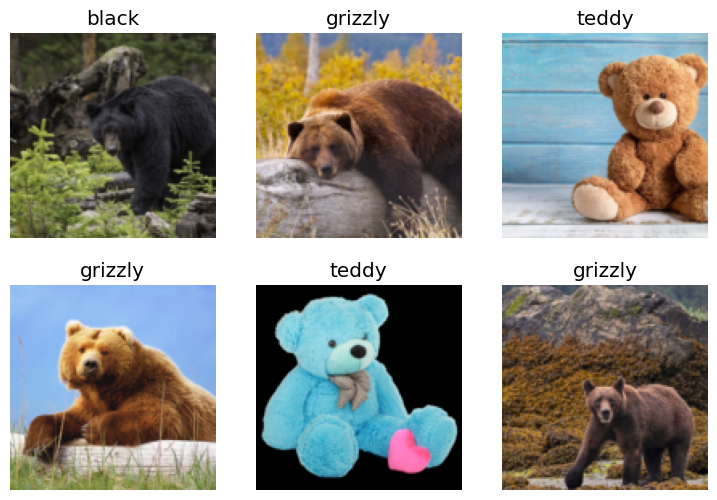

In [ ]:
dls.valid.show_batch(max_n=6,nrows=2)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


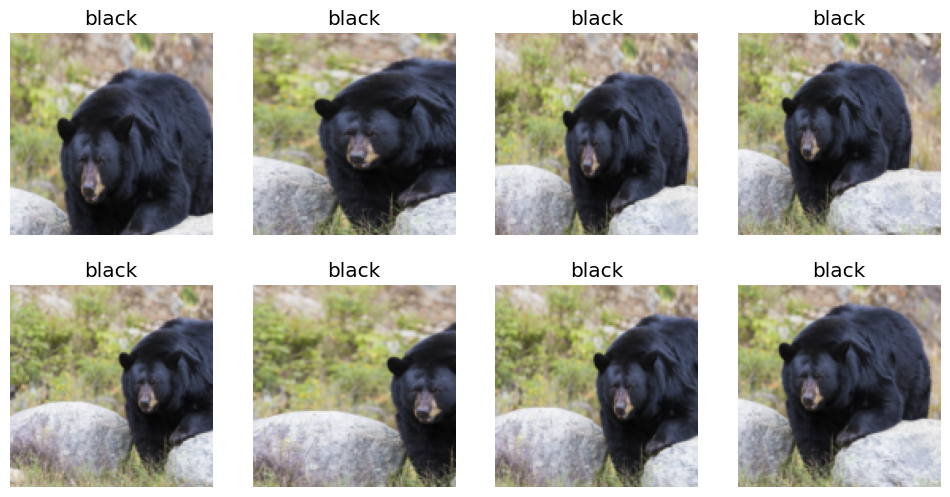

In [ ]:
bears=bears.new(item_tfms=RandomResizedCrop(128,min_scale=0.3))
dls=bears.dataloaders(root_path)
dls.train.show_batch(max_n=8,nrows=2,unique=True)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


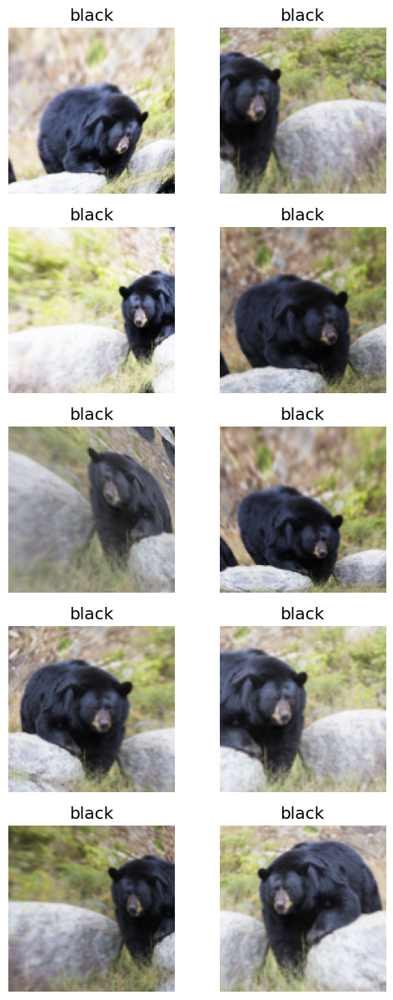

In [ ]:
bears=bears.new(item_tfms=Resize(128),batch_tfms=aug_transforms(mult=2))
dls=bears.dataloaders(root_path)
dls.train.show_batch(max_n=10,nrows=5,unique=True)

In [ ]:
bears=bears.new(
    item_tfms=RandomResizedCrop(224,min_scale=0.5),
    batch_tfms=aug_transforms())
dls=bears.dataloaders(root_path)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


In [ ]:
learn=vision_learner(dls,resnet18,metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 137MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.370722,0.101289,0.024390,01:25


epoch,train_loss,valid_loss,error_rate,time
0,0.192156,0.072409,0.012195,01:56
1,0.144259,0.060892,0.012195,01:53
2,0.117526,0.056003,0.012195,01:52
3,0.092468,0.046405,0.012195,01:53


/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


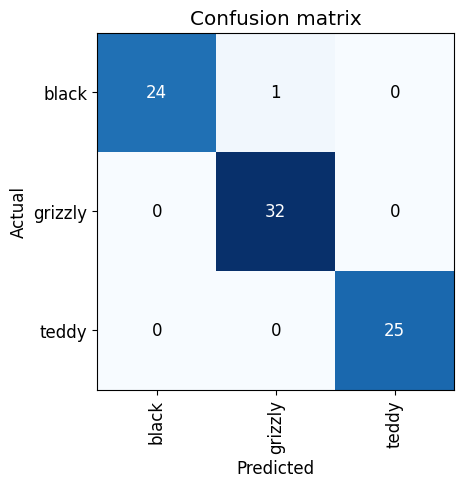

In [ ]:
interp=ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


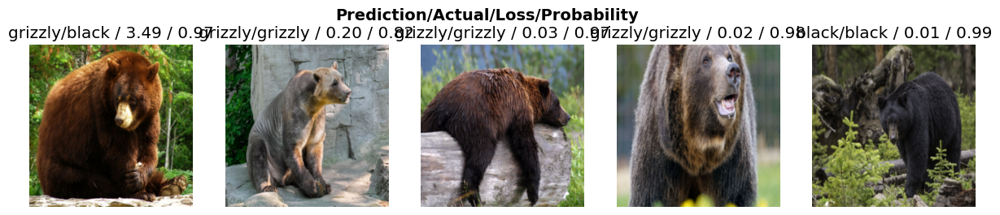

In [ ]:
interp.plot_top_losses(5,nrows=1)

In [ ]:
cleaner=ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
cleaner=ImageClassifierCleaner(learn)
cleaner